In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [3]:
# SECTION 1
car_img = [cv2.imread(f'/kaggle/input/dataset1/img{i}.jpg') for i in range(1, 11)]

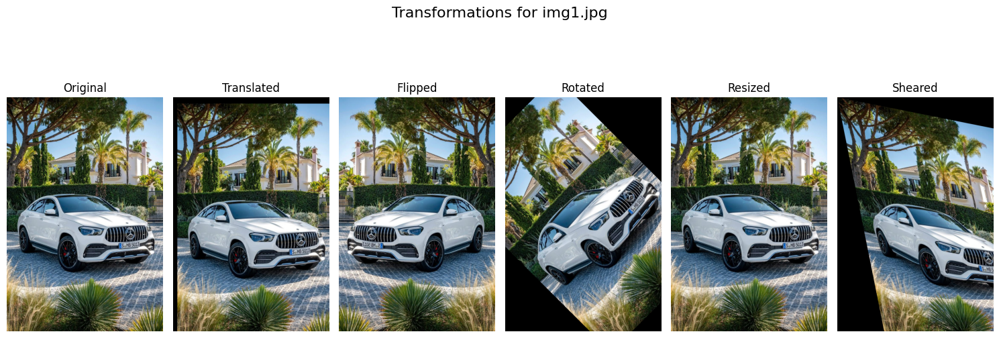

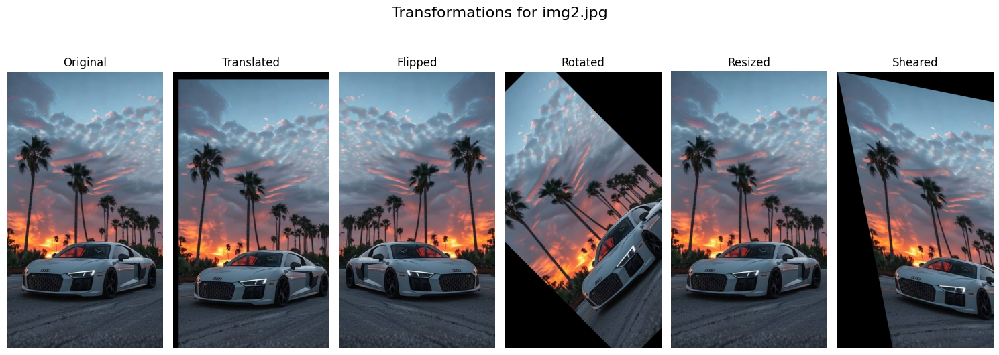

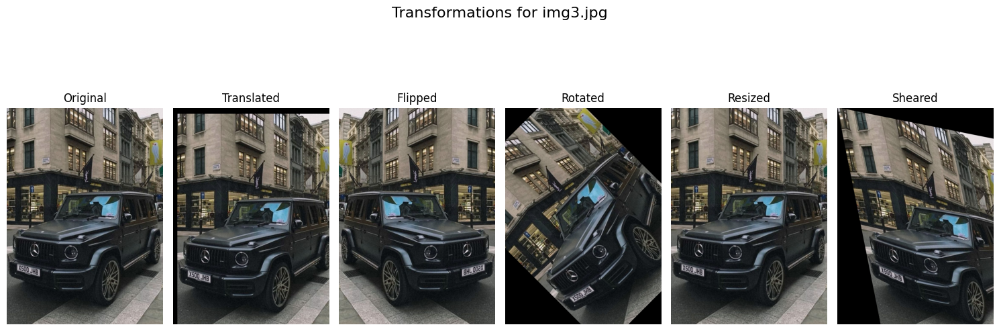

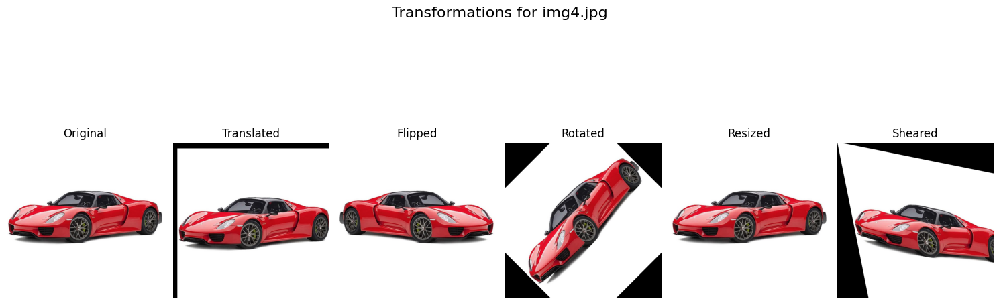

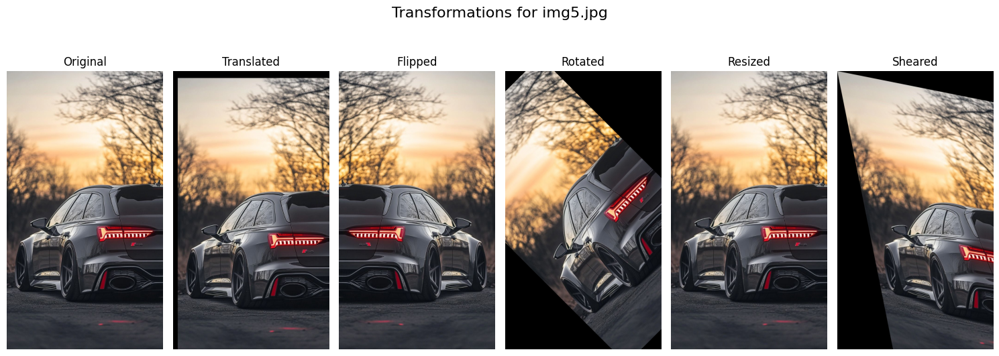

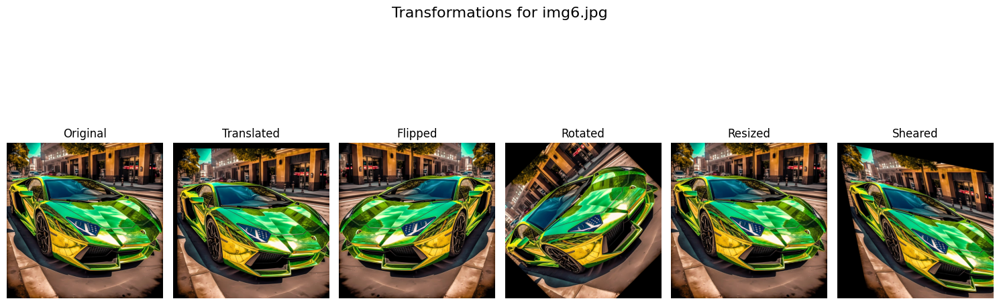

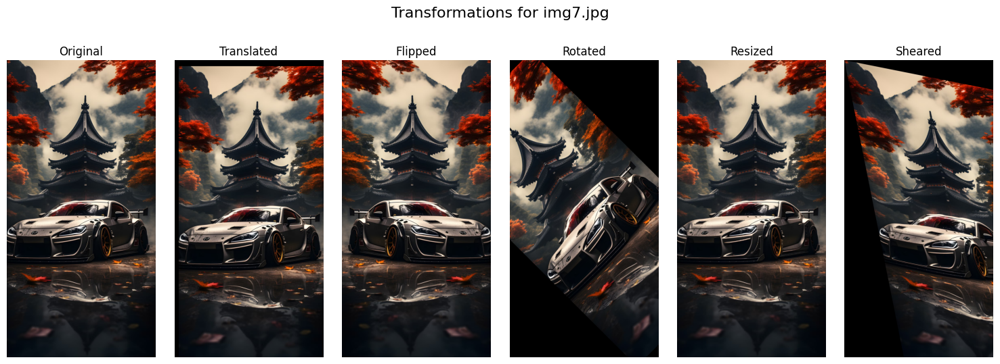

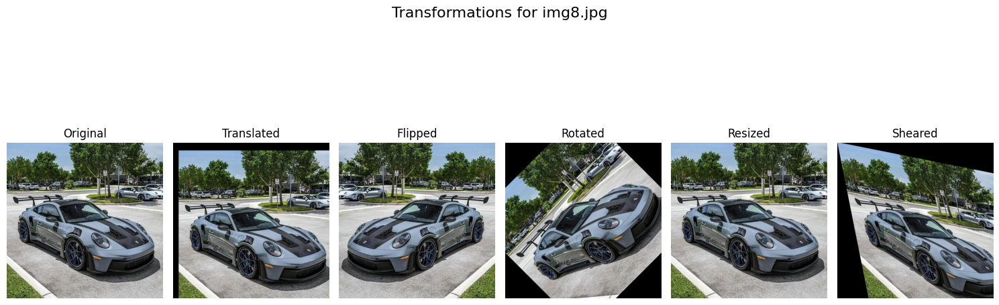

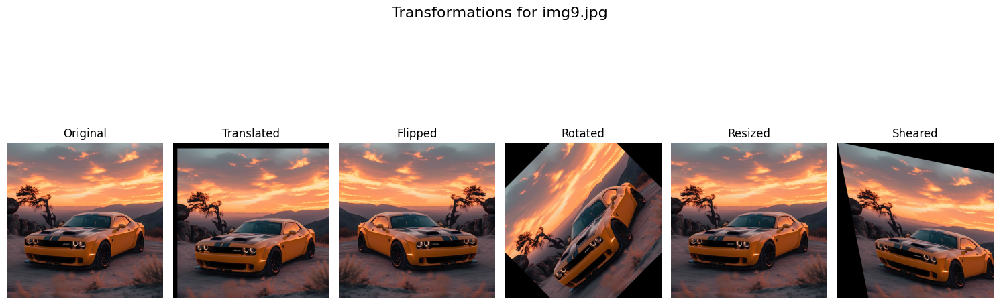

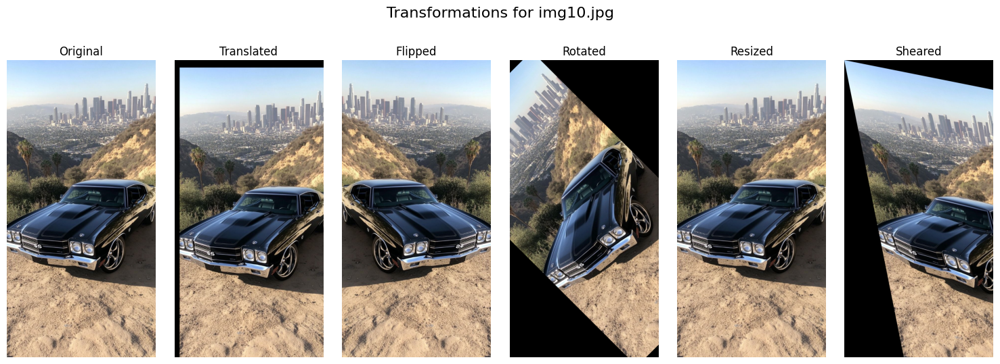

In [4]:
# SECTION 2
def apply_transformations(image):
    rows, cols = image.shape[:2]

    M = np.float32([[1, 0, 20], [0, 1, 30]])
    translated = cv2.warpAffine(image, M, (cols, rows))

    flipped = cv2.flip(image, 1)

    M = cv2.getRotationMatrix2D((cols/2, rows/2), 45, 1)
    rotated = cv2.warpAffine(image, M, (cols, rows))

    resized = cv2.resize(image, (int(cols * 0.7), int(rows * 0.7)))

    shear_matrix = np.float32([[1, 0.2, 0], [0.2, 1, 0]])
    sheared = cv2.warpAffine(image, shear_matrix, (cols, rows))

    return translated, flipped, rotated, resized, sheared

transformed_images = [apply_transformations(image) for image in car_img]

for i, image in enumerate(car_img):
    plt.figure(figsize=(15, 10))
    plt.suptitle(f"Transformations for img{i+1}.jpg", fontsize=16)

    plt.subplot(2, 6, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Original")
    plt.axis('off')

    transformation_titles = ['Translated', 'Flipped', 'Rotated', 'Resized', 'Sheared']
    for j, transformed in enumerate(transformed_images[i]):
        plt.subplot(2, 6, j+2)
        plt.imshow(cv2.cvtColor(transformed, cv2.COLOR_BGR2RGB))
        plt.title(transformation_titles[j])
        plt.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

### **What is the Logic Behind Choosing Image Transformations?**  

1. **Translation (Shift by 20px right, 30px down)** – This helps us recognize objects in different locations, making the model more position-invariant.  

2. **Flipping (Horizontal flip using `cxxv2.flip(image, 1)`)** – It enhances generalization by allowing recognition of objects from mirrored perspectives.  

3. **Rotation (45° around center using `cv2.getRotationMatrix2D`)** – It ensures the model understands objects in different orientations, useful for real-world scenarios.  

4. **Resizing (Scaled down by 30% using `cv2.resize(image, (int(cols * 0.7), int(rows * 0.7)))`)** – This helps with scale invariance so objects can be detected at different sizes.  

5. **Shearing (0.2 factor using an affine matrix)** – It can mimic perspective distortion, improving robustness when objects appear skewed.

<Figure size 1500x5000 with 0 Axes>

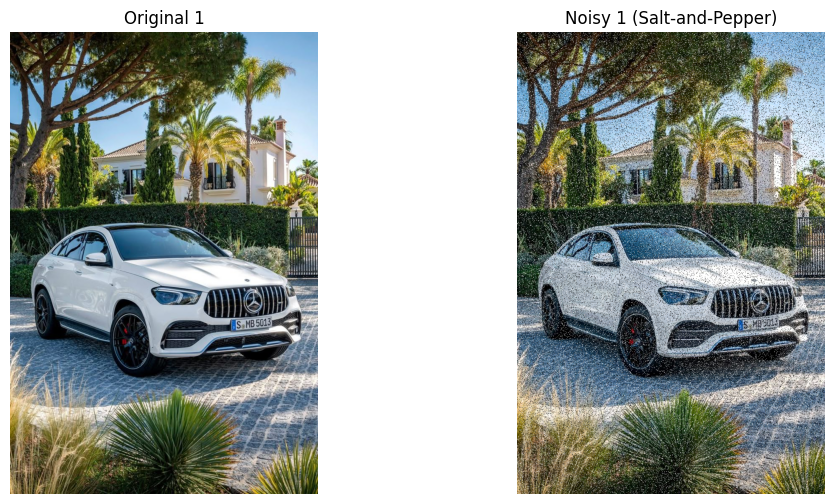

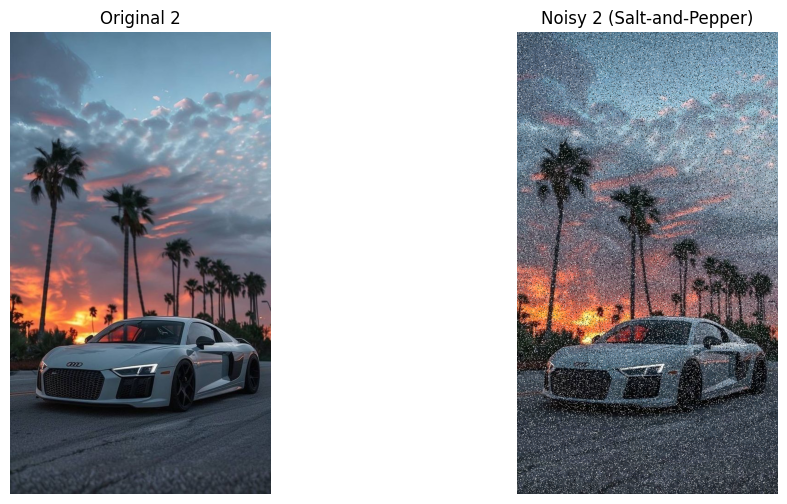

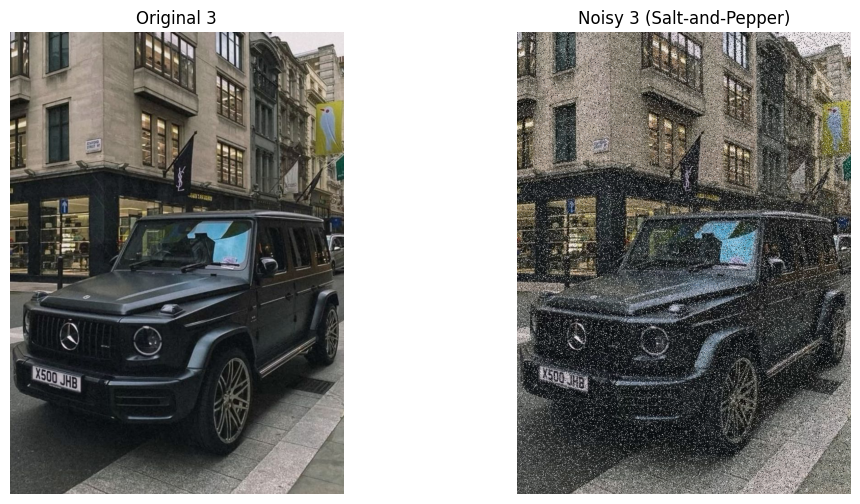

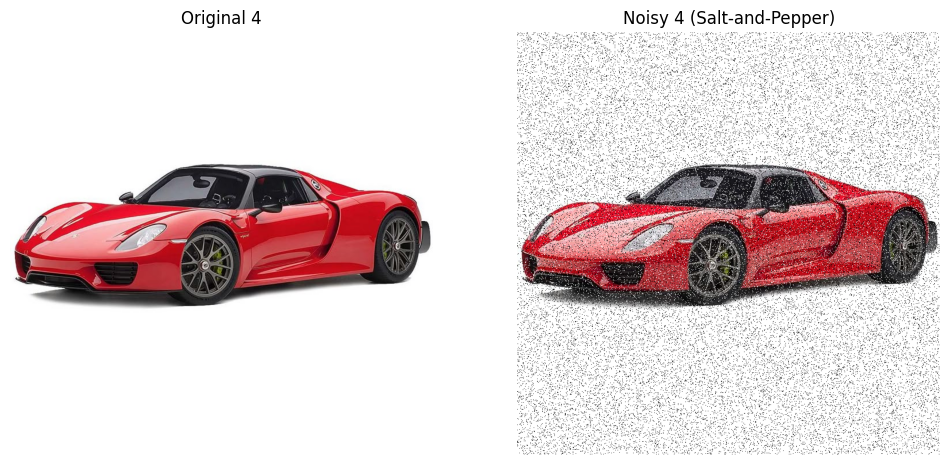

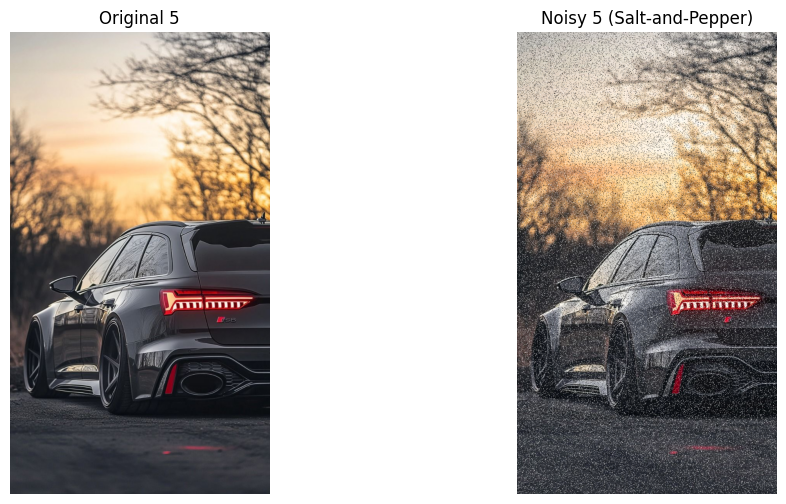

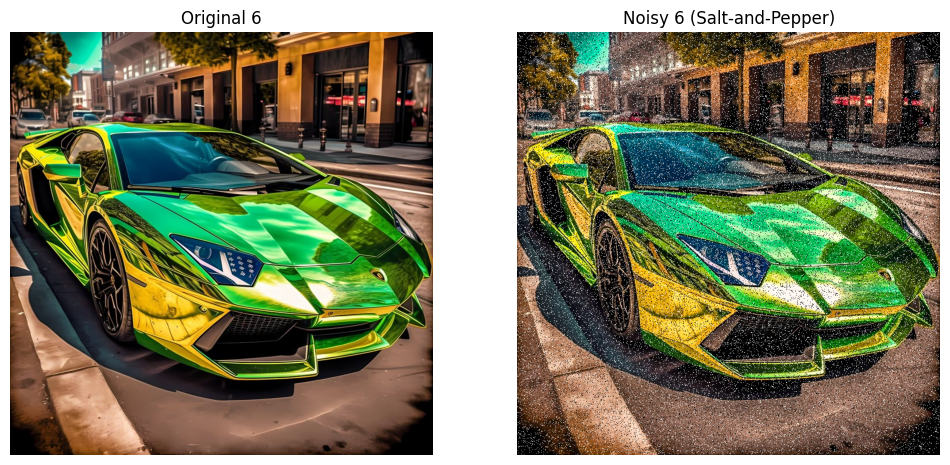

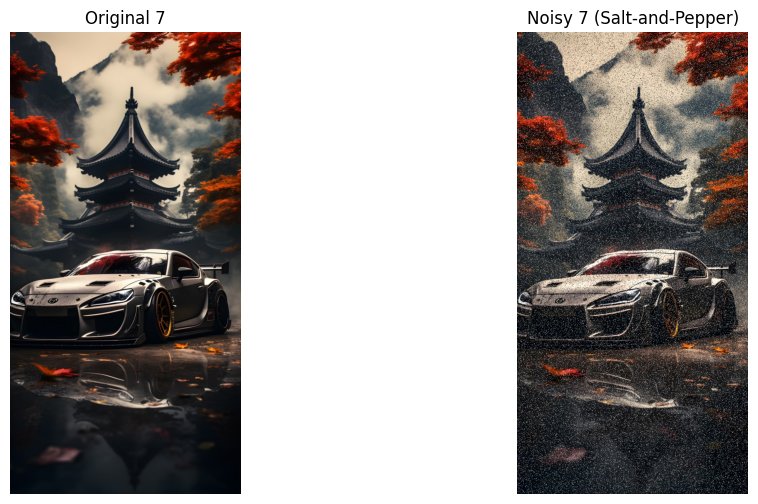

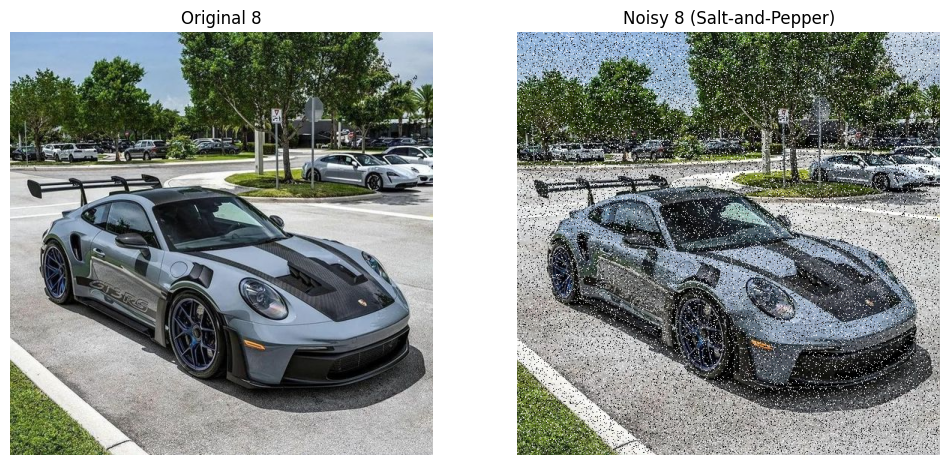

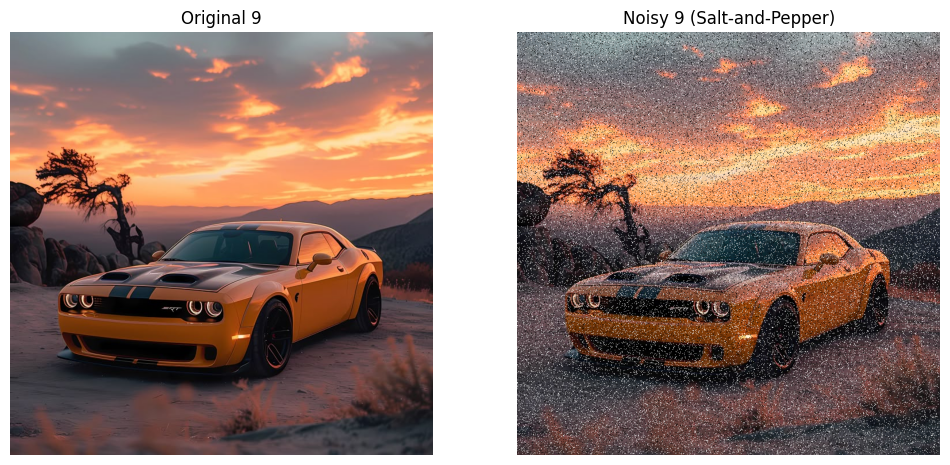

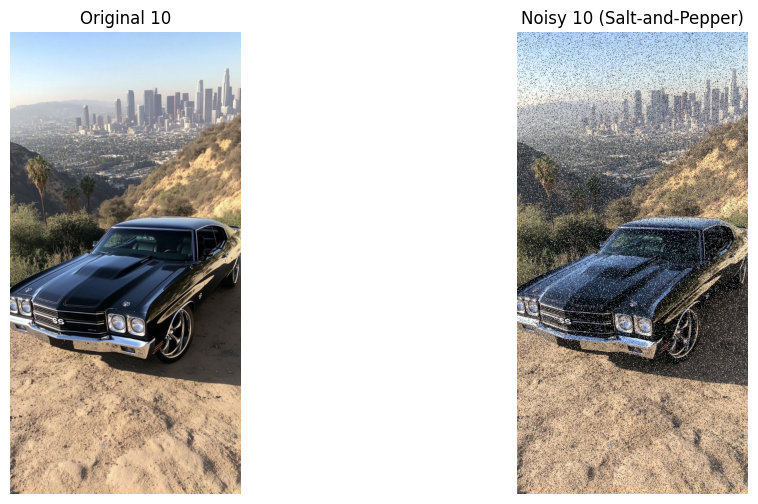

In [10]:
def add_salt_and_pepper_noise(image, prob=0.05):
    
    noisy_image = np.copy(image)
    row, col, ch = image.shape

    num_salt = int(np.ceil(prob * image.size * 0.5))
    num_pepper = int(np.ceil(prob * image.size * 0.5))

    coords_salt = [np.random.randint(0, i - 1, num_salt) for i in image.shape[:2]]
    noisy_image[coords_salt[0], coords_salt[1]] = [255, 255, 255]  # Set to white

    coords_pepper = [np.random.randint(0, i - 1, num_pepper) for i in image.shape[:2]]
    noisy_image[coords_pepper[0], coords_pepper[1]] = [0, 0, 0]  # Set to black

    return noisy_image

noisy_images = [add_salt_and_pepper_noise(image, prob=0.05) for image in car_img]

plt.figure(figsize=(15, 5 * len(car_img)))
plt.suptitle("Original and Noisy Images (Salt-and-Pepper)", fontsize=16)

for i, image in enumerate(car_img):
    plt.figure(figsize=(12, 6))

    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f"Original {i+1}")
    plt.axis('off')

    # Noisy image
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(noisy_images[i], cv2.COLOR_BGR2RGB))
    plt.title(f"Noisy {i+1} (Salt-and-Pepper)")
    plt.axis('off')

    plt.show()

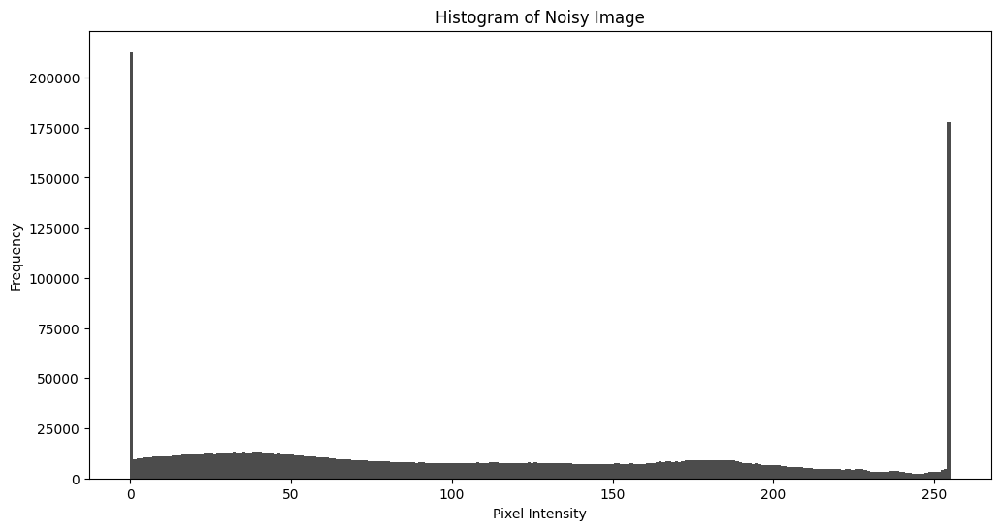

In [11]:
#Section 4
plt.figure(figsize=(12, 6))
plt.hist(noisy_images[0].ravel(), bins=256, color='black', alpha=0.7)
plt.title("Histogram of Noisy Image")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()